# Q-Learning (Taxi-v2)

In this notebook I present an implementation of the Q-learning algorithm and apply it to the "Taxi-v2" AI Gym Environment in roder to obtain the optimal Q-table values for the problem. 

### Dependencies

In [1]:
from IPython.display import clear_output
import numpy as np
import random
import time
import gym

### Envinroment: [Taxi-v2](https://gym.openai.com/envs/Taxi-v2/)

This task was introduced in [Dietterich2000](https://dl.acm.org/citation.cfm?id=1622268) to illustrate some issues in hierarchical reinforcement learning. There are 4 locations (labeled by different letters) and your job is to pick up the passenger at one location and drop him off in another. You receive +20 points for a successful dropoff, and lose 1 point for every timestep it takes. There is also a 10 point penalty for illegal pick-up and drop-off actions.

In [2]:
env = gym.make("Taxi-v3") # Create environment
env.render() # Show it

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+



### Q-table

In [*Q-learning*](https://en.wikipedia.org/wiki/Q-learning) the goal is to learn a policy that will tell an agent which action to take under each possible state. The *Q-table* is responsible to store **score** values for each *(state, action)* pair. These values can be initialized with zeros or randomly, and them they are updated as you perform *exploration* in your problem domain (which helps to discover which actions leads to a better stream of rewards)

In [3]:
# Number of possible actions
action_size = env.action_space.n 
print("Action size ", action_size) 

# Number of possible states
state_size = env.observation_space.n 
print("State size ", state_size)

Action size  6
State size  500


In [4]:
qtable = np.zeros((state_size, action_size))
print(qtable)

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]


### Hyper-parameters

In [5]:
episodes = 3000          # Total episodes
max_steps = 100            # Max steps per episode
lr = 0.3                    # Learning rate
decay_fac = 0.00001         # Decay learning rate each iteration
gamma = 0.90                # Discounting rate - later rewards impact less
R1 = []
E1 = []

### Exploration (Q-learning)

Since **the goal here is to learn the optimal q-table**, that is, best policy for each (state,action) pair: we need to perform exploration only. If the goal was to learn and solve the environment as quickly as possible, it would be necessary to implement an [exploration-exploitation](http://home.deib.polimi.it/restelli/MyWebSite/pdf/rl5.pdf) strategy. This kind of strategy would not work for this goal since we want to discover the optimal values for states that would not often/never be visited via the exploration-exploitation strategy.

The exploration strategy here implemented is straightforward: for each state we get to, *take an action randomly*. The randomness "guarantees" that we are going to visit each state action pair eventually.

In [6]:
for episode in range(episodes):
    
    state = env.reset() # Reset the environment
    done = False        # Are we done with the environment
    lr -= decay_fac     # Decaying learning rate
    step = 0
    Sum = 0
   
    
    if lr <= 0: # Nothing more to learn?
        break
        
    for step in range(max_steps):
        
        # Randomly Choose an Action
        action = env.action_space.sample()
        
        # Take the action -> observe new state and reward
        new_state, reward, done, info = env.step(action)
        Sum += reward
        
        # Update qtable values
        if done == True: # If last, do not count future accumulated reward
            qtable[state, action] = qtable[state, action]+lr*(reward+gamma*0-qtable[state,action])
            break
        else: # Consider accumulated reward of best decision stream
            qtable[state, action] = qtable[state,action]+lr*(reward+gamma*np.max(qtable[new_state,:])-qtable[state,action])
            
        # moving states
        state = new_state
    
    print("The sum of rewards is {}".format(Sum))
    print("for episode {}".format(episode))
    episode
    R1.append(Sum)
    E1.append(episode)
    episode += 1
    print(R1)
    
    if (episode % 3000 == 0):
        print('episode = ', episode)
        print('learning rate = ', lr)
        print('-----------')
        


The sum of rewards is -370
for episode 0
[-370]
The sum of rewards is -343
for episode 1
[-370, -343]
The sum of rewards is -343
for episode 2
[-370, -343, -343]
The sum of rewards is -343
for episode 3
[-370, -343, -343, -343]
The sum of rewards is -442
for episode 4
[-370, -343, -343, -343, -442]
The sum of rewards is -433
for episode 5
[-370, -343, -343, -343, -442, -433]
The sum of rewards is -388
for episode 6
[-370, -343, -343, -343, -442, -433, -388]
The sum of rewards is -415
for episode 7
[-370, -343, -343, -343, -442, -433, -388, -415]
The sum of rewards is -388
for episode 8
[-370, -343, -343, -343, -442, -433, -388, -415, -388]
The sum of rewards is -397
for episode 9
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397]
The sum of rewards is -361
for episode 10
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361]
The sum of rewards is -352
for episode 11
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352]
The sum of rewards is -370

The sum of rewards is -424
for episode 99
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424]
The sum of rewards is -370
for episode 100
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -

The sum of rewards is -343
for episode 120
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343]
The sum of rewards is -397
for episode 121
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, 

The sum of rewards is -433
for episode 151
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433]
The sum of rewards is -343
for episode 152
[

[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -334, -370, -361, -34

The sum of rewards is -379
for episode 223
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -388
for episode 258
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -352
for episode 297
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -352
for episode 339
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -442
for episode 367
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -406
for episode 394
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -424
for episode 417
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

for episode 450
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -334,

The sum of rewards is -379
for episode 483
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -361
for episode 518
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -442
for episode 552
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -505
for episode 586
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -361
for episode 625
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -334
for episode 675
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -433
for episode 713
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -316
for episode 744
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -334, -370, -361, -34

The sum of rewards is -370
for episode 807
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -334
for episode 842
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -361
for episode 880
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -433
for episode 916
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -514
for episode 951
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -424
for episode 984
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -3

The sum of rewards is -370
for episode 1017
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -388
for episode 1050
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -478
for episode 1082
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -406
for episode 1120
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for episode 1409
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -33

The sum of rewards is -370
for episode 1446
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -370
for episode 1477
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -451
for episode 1504
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -334, -370, -361, -34

The sum of rewards is -361
for episode 1584
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -352
for episode 1619
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -487
for episode 1658
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -361
for episode 1692
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



The sum of rewards is -370
for episode 2082
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -388
for episode 2120
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -379
for episode 2153
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -388
for episode 2192
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

for episode 2223
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -379, -397, -415, -424, -334

The sum of rewards is -433
for episode 2253
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



The sum of rewards is -460
for episode 2671
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -424
for episode 2706
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -433
for episode 2726
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -388
for episode 2751
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -343
for episode 2783
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

The sum of rewards is -460
for episode 2812
[-370, -343, -343, -343, -442, -433, -388, -415, -388, -397, -361, -352, -370, -325, -469, -343, -442, -352, -388, -248, -397, -370, -397, -424, -442, -433, -343, -406, -352, -442, -379, -388, -433, -433, -343, -415, -406, -406, -379, -379, -388, -388, -433, -379, -343, -406, -352, -415, -361, -352, -397, -397, -415, -406, -433, -412, -397, -406, -361, -451, -424, -388, -334, -379, -469, -397, -379, -451, -370, -460, -406, -289, -361, -316, -424, -424, -388, -361, -343, -478, -424, -343, -442, -469, -442, -343, -343, -460, -325, -379, -415, -397, -343, -397, -406, -370, -415, -388, -469, -424, -370, -397, -433, -406, -352, -352, -424, -352, -442, -370, -370, -388, -424, -415, -397, -424, -415, -415, -406, -406, -343, -397, -379, -433, -370, -424, -424, -406, -379, -388, -325, -415, -325, -406, -298, -460, -370, -370, -397, -388, -352, -460, -397, -415, -316, -370, -325, -370, -406, -451, -379, -433, -343, -343, -424, -397, -352, -379, -352, -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Using Q-table

Now that we have the optimal values in the Q-table, we can use it to see our agent taking the best actions in this setting.
You can re-run the code below to see it solving different environments.

In [7]:
# New environment
state = env.reset()
env.render()
done = False
total_reward = 0

while(done == False):
    action = np.argmax(qtable[state,:]) # Choose best action (Q-table)
    state, reward, done, info = env.step(action) # Take action
    total_reward += reward  # Sum of rewards
    
    # Display it
    time.sleep(0.5)
    clear_output(wait=True)
    env.render()
    print('Episode Reward = ', total_reward)

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Dropoff)
Episode Reward =  9


In [8]:
env.P[328]
env.s = 328  # set environment to illustration's state
total = 0
epochs = 0
penalties, reward = 0, 0
R2 = []
E2 = []
frames = [] # for animation

done = False

while not done:
    action = env.action_space.sample()
    state, reward, done, info = env.step(action)
    total += reward

    if reward == -10:
        penalties += 1
    
    # Put each rendered frame into dict for animation
    frames.append({
        'frame': env.render(mode='ansi'),
        'state': state,
        'action': action,
        'reward': reward
        }
    )
    R2.append(total)
    E2.append(epochs)
    print(R2)
    epochs += 1
    
    
print("Timesteps taken: {}".format(epochs))
print("Penalties incurred: {}".format(penalties))


[-1]
[-1, -2]
[-1, -2, -3]
[-1, -2, -3, -4]
[-1, -2, -3, -4, -5]
[-1, -2, -3, -4, -5, -6]
[-1, -2, -3, -4, -5, -6, -7]
[-1, -2, -3, -4, -5, -6, -7, -8]
[-1, -2, -3, -4, -5, -6, -7, -8, -18]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33, -43]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33, -43, -44]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33, -43, -44, -45]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33, -43, -44, -45, -46]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23, -33, -43, -44, -45, -46, -56]
[-1, -2, -3, -4, -5, -6, -7, -8, -18, -19, -20, -21, -22, -23,

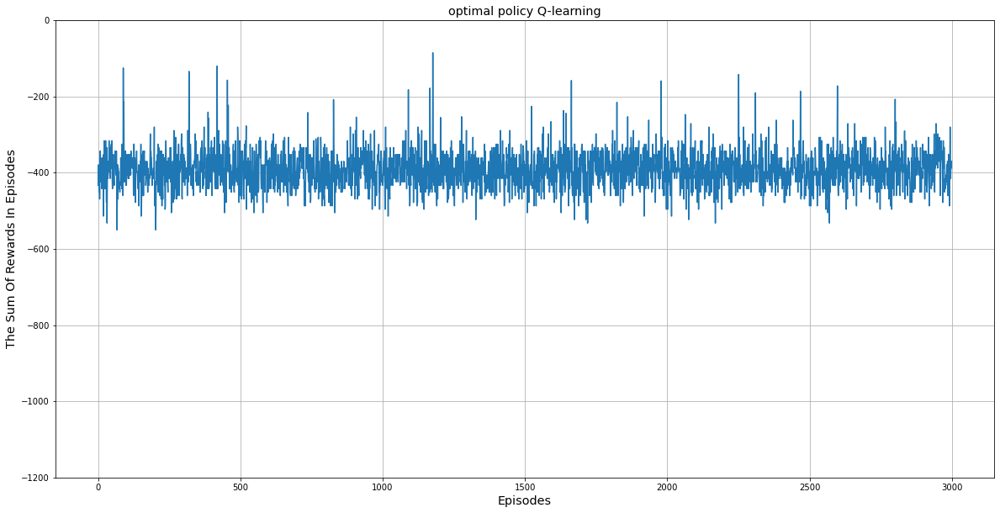

In [9]:
import numpy as np
import matplotlib.pyplot as plt


t = np.array(R1)              # white noise 1
s = np.array(E1)              # white noise 2


params = {'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         }
plt.rcParams.update(params)

fig, ax = plt.subplots()
ax.plot(s, t) 
ax.set(xlabel='Episodes', ylabel='The Sum Of Rewards In Episodes',
       title='optimal policy Q-learning')
ax.grid()
ax.set_ylim(-1200,0)

fig.set_size_inches(20, 10)
fig.savefig('test2png.png', dpi=100)


plt.show()

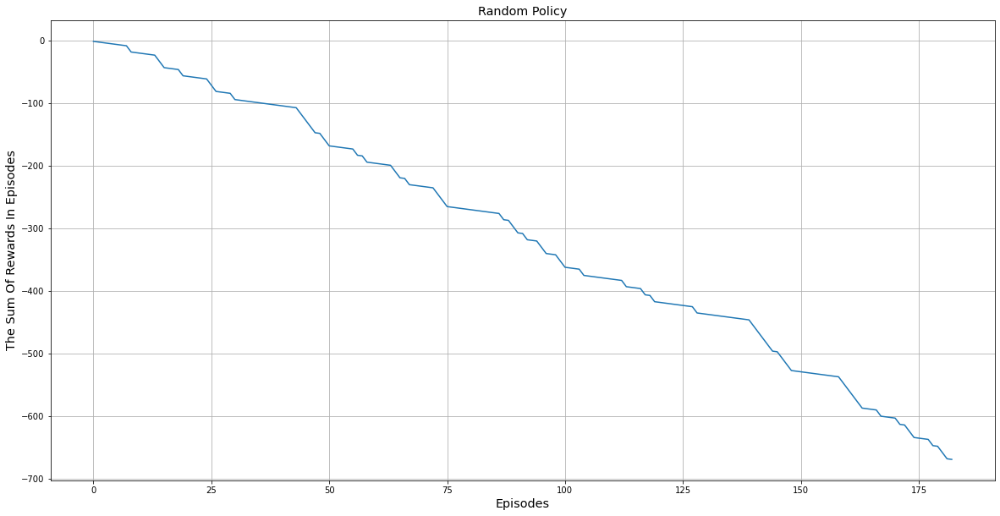

In [10]:
t = np.array(R2)              # white noise 1
s = np.array(E2)              # white noise 2


params = {'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         }
plt.rcParams.update(params)

fig, ax = plt.subplots()
ax.plot(s, t) 
ax.set(xlabel='Episodes', ylabel='The Sum Of Rewards In Episodes',
       title='Random Policy')
ax.grid()


fig.set_size_inches(20, 10)
fig.savefig('Random.png', dpi=100)


plt.show()